# 1. Import modules and load MERFISH data 

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import anndata
import scanpy as sc
import os

import matplotlib.pyplot as plt

sc.settings.n_jobs = 24
sc.settings.set_figure_params(dpi=150, dpi_save=300, frameon=False, figsize=(3,3), fontsize=7.5, facecolor='white')

# 2. Load MERLin analysis results

In [3]:
#merlin_output_folder = r'\\10.245.74.158\Chromatin_NAS_8\MERFISH\human\20221026-hM1_hM1'
merlin_output_folder = r'I:\MERFISH_Analysis\20221026-hM1_hM1'
# generate post-analysis folders
postanalysis_folder = os.path.join(merlin_output_folder, 'PostAnalysis')
if not os.path.exists(postanalysis_folder):
    print(f"Create postanalysis_folder: {postanalysis_folder}")
    os.makedirs(postanalysis_folder)
else:
    print(f"Use postanalysis_folder: {postanalysis_folder}")

Create postanalysis_folder: I:\MERFISH_Analysis\20221026-hM1_hM1\PostAnalysis


In [4]:
figure_folder = os.path.join(postanalysis_folder, 'Figures')
if not os.path.exists(figure_folder):
    print(f"Create figure_folder: {figure_folder}")
    os.makedirs(figure_folder)
else:
    print(f"Use figure_folder: {figure_folder}")

sc.settings.figdir = figure_folder

Create figure_folder: I:\MERFISH_Analysis\20221026-hM1_hM1\PostAnalysis\Figures


## Load metadata

In [5]:
# Load Cell information
cell_meta_data_file = os.path.join(merlin_output_folder, 'ExportCellMetadata', 'feature_metadata.csv')
cell_meta_data = pd.read_csv(cell_meta_data_file)
cell_meta_data

,Unnamed: 0,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y
0,103185052772314091518311382537360457542,0,89.067825,-4800.859995,582.181977,-4802.706795,-4799.013194,578.985177,585.378777
1,109987920040226878833064389842115152493,0,44.323319,-4793.407994,574.081976,-4795.686794,-4791.129194,572.397176,575.766776
2,110279436536064170856981669058780844611,0,306.342029,-5001.902000,703.141980,-5004.990800,-4998.813200,699.081180,707.202780
3,118280606356346579861715060189562990641,0,617.019100,-4884.829997,731.815980,-4889.646797,-4880.013197,727.269180,736.362781
4,126638188311190590174670570209273431135,0,44.326701,-4836.769995,615.715977,-4839.102796,-4834.437195,613.869177,617.562778
...,...,...,...,...,...,...,...,...,...
19607,69653267290095922034879543783158568882,395,598.622872,-5265.899998,713.619974,-5271.742798,-5260.057198,709.451174,717.788774
19608,78394055865413795969291558605829439230,395,610.698961,-5270.921998,660.159972,-5275.522798,-5266.321198,655.667172,664.652773
19609,83013689012357297652394605755753626780,395,649.833666,-5273.459998,715.725974,-5278.330798,-5268.589198,710.855174,720.596774
19610,87712053602751859743231483667950045426,395,353.116071,-5238.683997,650.979972,-5242.474797,-5234.893197,646.919172,655.040772


In [6]:
# Load decoded counts information
counts_file_mer = os.path.join(merlin_output_folder, 'ExportPartitionedBarcodes', 'barcodes_per_feature.csv')
df = pd.read_csv(counts_file_mer).rename(columns={'Unnamed: 0':'index'}).set_index('index')

In [7]:
# remove blanks
blanks = [_c for _c in df.columns if 'Blank-' in _c]
df = df.drop(columns=blanks)

adata = anndata.AnnData(df)
adata.obs = adata.obs.merge(cell_meta_data, left_index=True, right_on='Unnamed: 0').set_index('Unnamed: 0')

df

C:\Users\puzheng_new\AppData\Local\Temp\2\ipykernel_19328\3737320187.py:5: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = anndata.AnnData(df)


,CD52,PTPRU,MARCKSL1,RSPO1,POU3F1,RAB3B,ROR1,PTGER3,SLC44A5,ST6GALNAC5,...,SYNE2,IFI27,CDH11,ZFHX3,VAT1L,EPN2,NPTX1,ZNF536,KIAA1755,PCDH11X
index,,,,,,,,,,,,,,,,,,,,,
103185052772314091518311382537360457542,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
109987920040226878833064389842115152493,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
110279436536064170856981669058780844611,0.0,0.0,11.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,2.0,1.0,0.0
118280606356346579861715060189562990641,0.0,2.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,3.0,0.0,3.0,5.0,0.0
126638188311190590174670570209273431135,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69653267290095922034879543783158568882,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
78394055865413795969291558605829439230,0.0,1.0,8.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0
83013689012357297652394605755753626780,0.0,0.0,6.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,3.0,0.0,2.0,14.0,0.0,0.0,0.0,3.0


# 4. Preprocess and filter the MERFISH data 

In [8]:
# Calculate quality control metrics
sc.pp.calculate_qc_metrics(adata, percent_top=None, log1p=False, inplace=True)

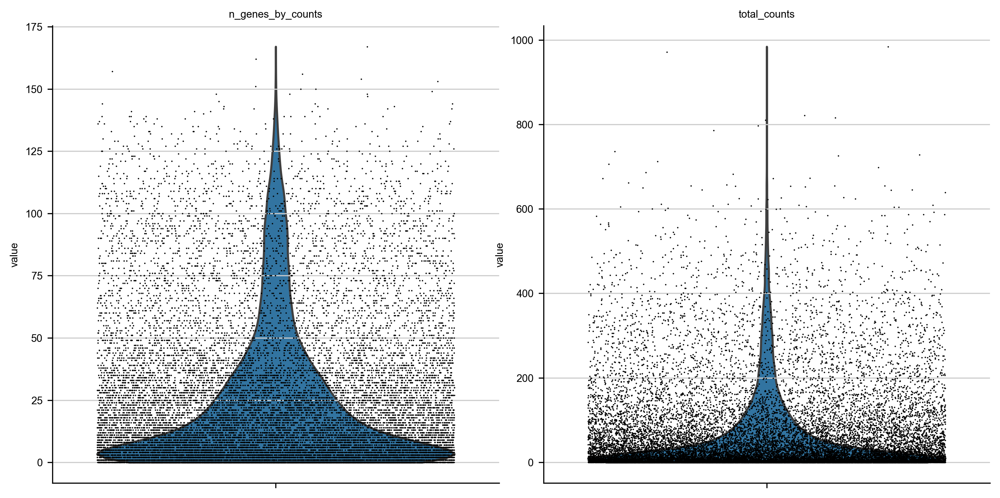

In [9]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True)

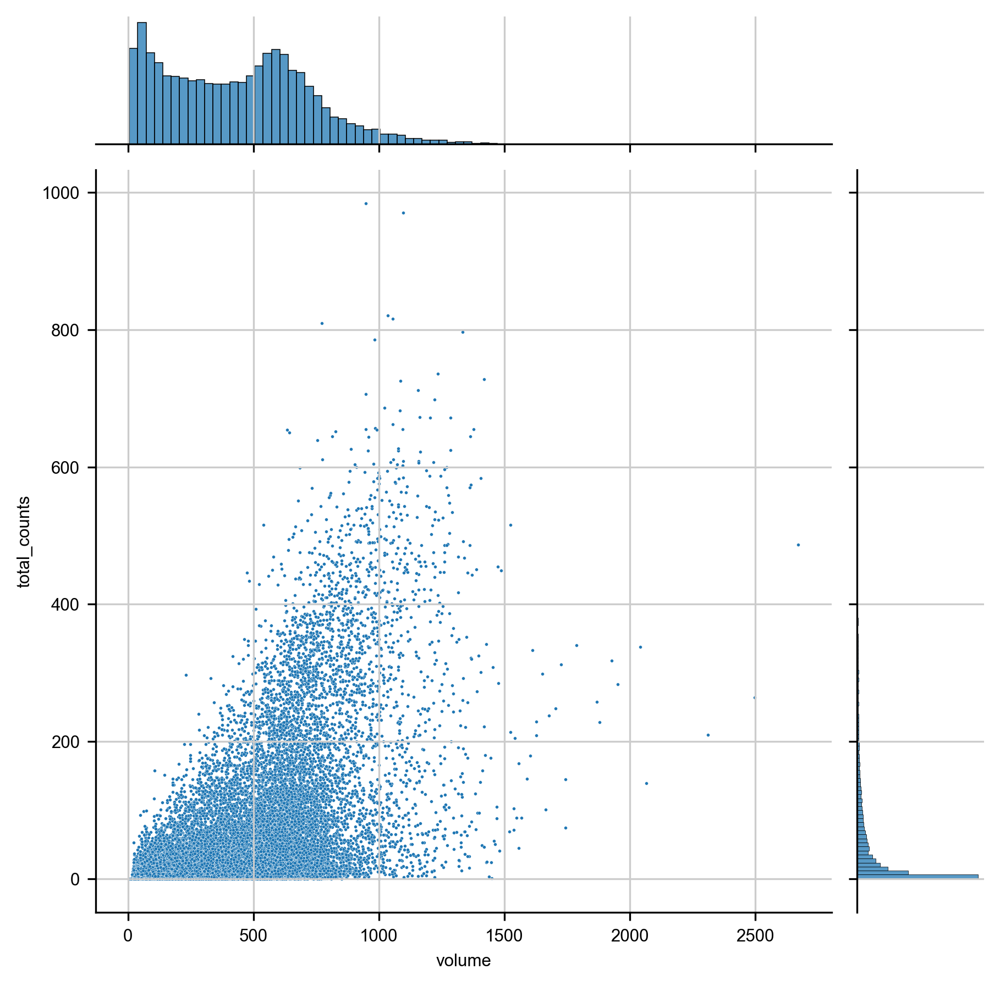

In [10]:
sns.jointplot(data=adata.obs, x='volume', y='total_counts', s=2,)

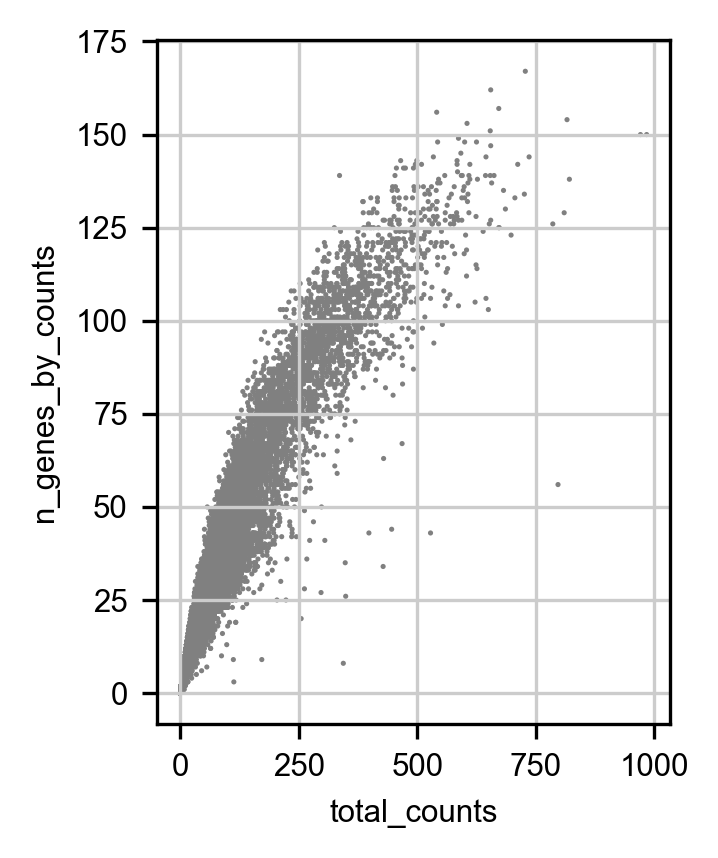

In [11]:
# Plot the distributions of gene counts
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')

In [12]:
gene_count_threshold = 5
total_count_threshold = 10
volume_threshold = 200
volume_upper_threshold = 6000
# Filtering
adata = adata[adata.obs['n_genes_by_counts'] > gene_count_threshold]
adata = adata[adata.obs['total_counts'] > total_count_threshold]
adata = adata[adata.obs['volume'] > volume_threshold]
adata = adata[adata.obs['volume'] <= volume_upper_threshold]

print(len(adata) / len(cell_meta_data) , len(adata))

0.5474199469712421 10736


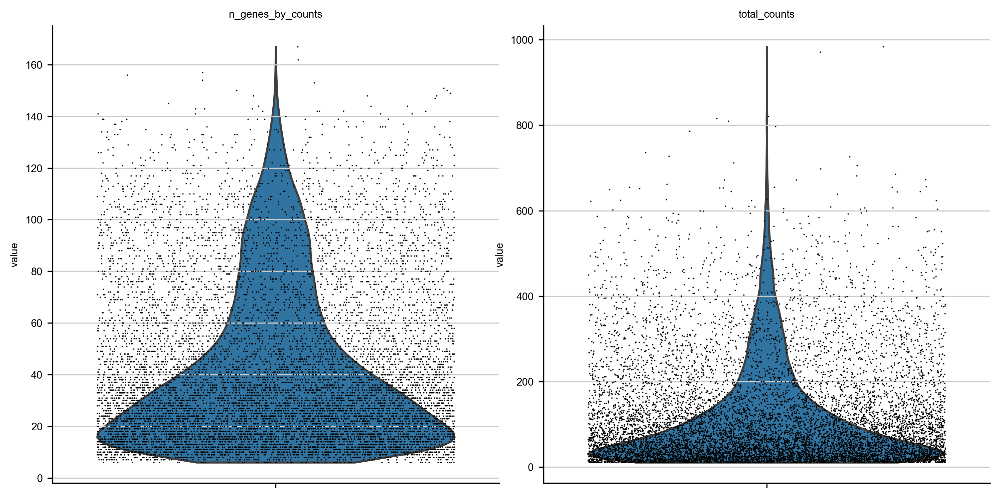

In [13]:
# A violin plot of some of the computed quality measures:
# - the number of genes expressed in the count matrix
# - the total counts per cell
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True, save='_after_filter_counts.png')

In [14]:
# plot mean count
adata.obs['total_counts'].median()

74.0

## 4. PCA and UMAP of the MERFISH data (for quick test)

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\preprocessing\_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


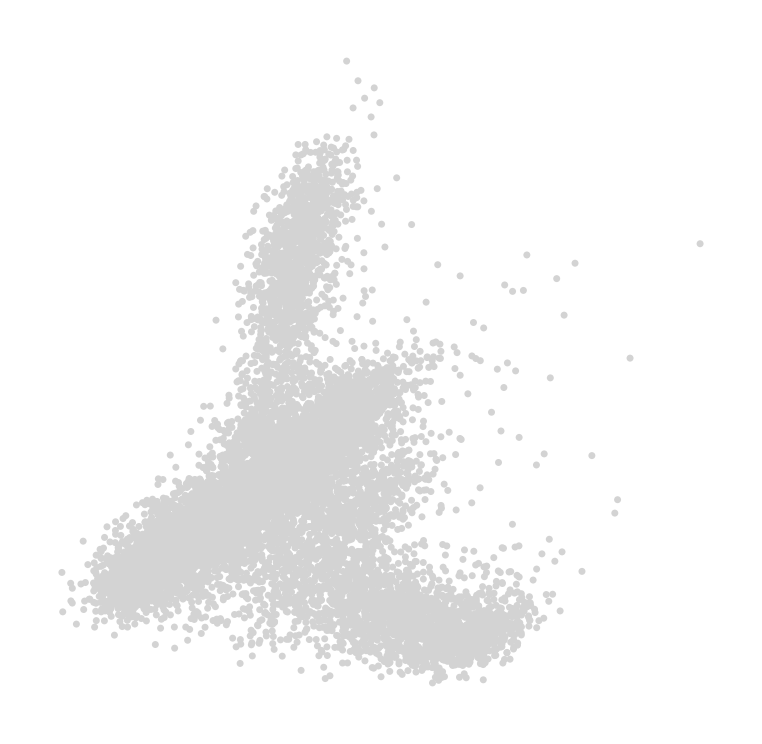

Wall time: 16.5 s


In [15]:
%%time
# Total-count normalize (library-size correct) the data matrix to 10,000 reads per cell
sc.pp.normalize_total(adata, target_sum=1e2)
# Logarithmize the data
sc.pp.log1p(adata)
# Regress out total counts
sc.pp.regress_out(adata, 'total_counts')
# Convert gene expressions to Z-scores
sc.pp.scale(adata, max_value=10)
# Principal component analysis
sc.tl.pca(adata, svd_solver='arpack')
# Plot the PCA results
sc.pl.pca(adata)

In [16]:
%%time
# Computing the neighborhood graph
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=30)

Wall time: 27.3 s


In [18]:
%%time
# Clustering
sc.tl.leiden(adata, resolution=1)

Wall time: 614 ms


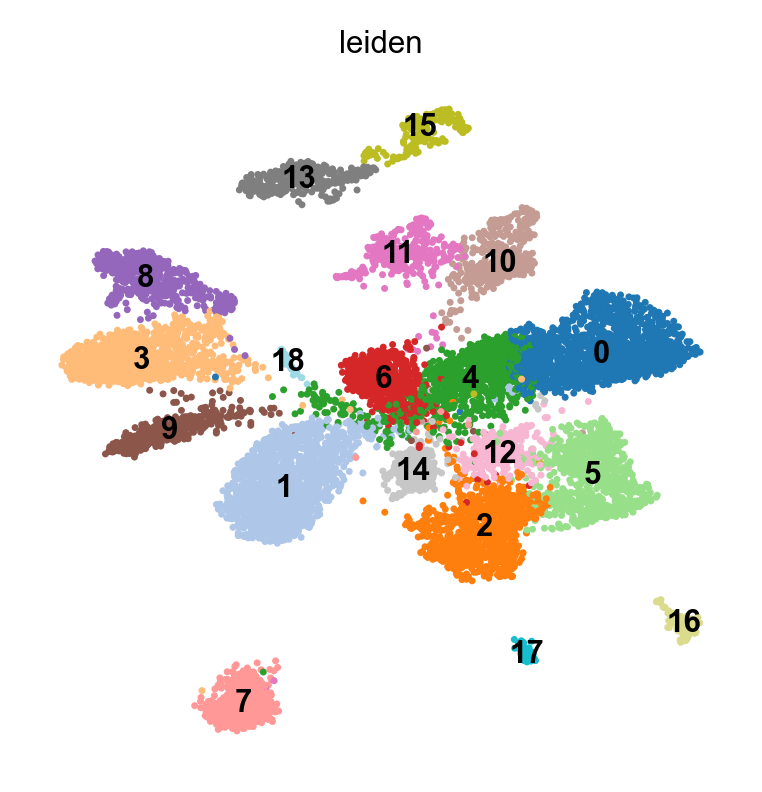

Wall time: 14.2 s


In [49]:
%%time
# Embed with UMAP
sc.tl.umap(adata)
# Plot the UMAP
sc.pl.umap(adata, color='leiden', 
           legend_loc='on data',
           palette='tab20',
           save='_cluster.png',
           )

## 5. Check count for each cell for genes of interest

In [20]:
# direcly use previous leiden
adata.obs['leiden_cluster'] = adata.obs.leiden

## T-test to identify marker genes

E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2
  self.stats[group_name, 'logfoldchanges'] = np.log2(
E:\Users\puzheng_new\Anaconda3\envs\postanalysis\lib\site-packages\scanpy\tools\_rank_genes_groups.py:420: RuntimeWarning: invalid value encountered in log2

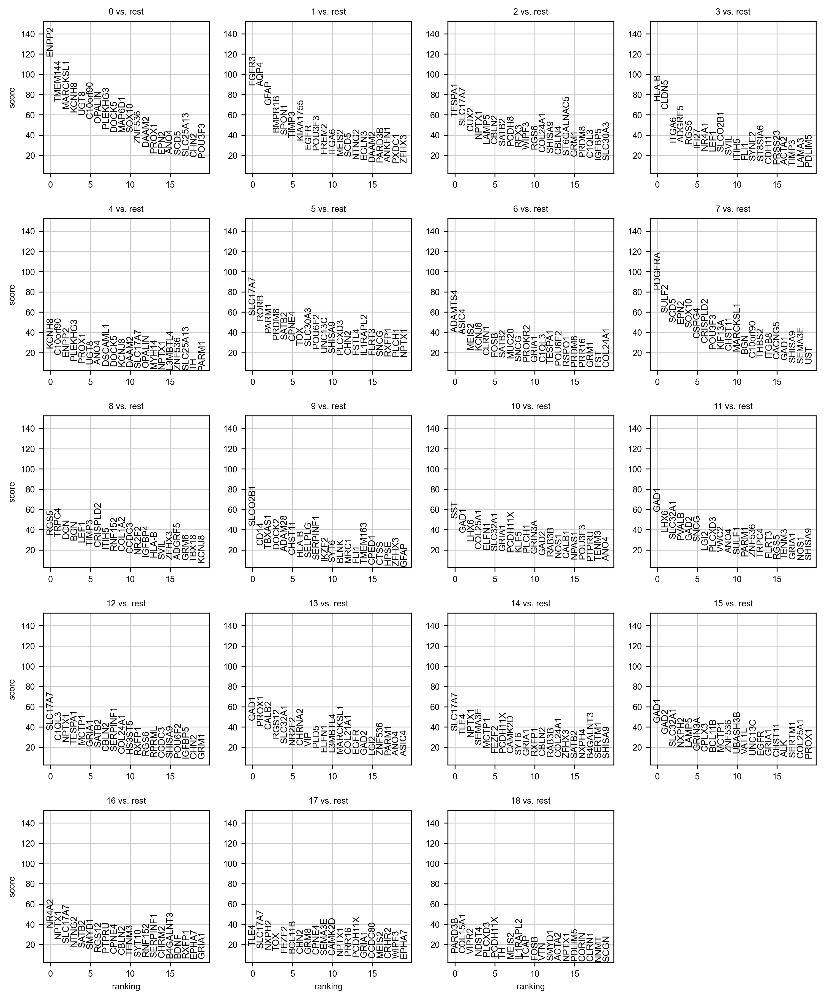

In [21]:
sc.tl.rank_genes_groups(adata, groupby='leiden_cluster', method='t-test')
sc.pl.rank_genes_groups(adata, groupby='leiden_cluster')

In [22]:
gene_ordering = np.array([list(_gnames) for _gnames in adata.uns['rank_genes_groups']['names']])

In [23]:
# assign clusters
clusters = np.sort(np.unique(adata.obs['leiden_cluster']).astype(np.int32))

# Inhibitory
inhibitory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC32A1')[0] < 20:
        print(_i, end=', ')
        inhibitory_clusters.append(_i)
# excitatory
print("")
excitatory_clusters = []
for _i in clusters:
    if np.where(gene_ordering[:,_i]=='SLC17A7')[0] < 20:
        print(_i, end=', ')
        excitatory_clusters.append(_i)
nonneuron_clusters = []
for _i in clusters:
    if _i not in inhibitory_clusters and _i not in excitatory_clusters:
        nonneuron_clusters.append(_i)

10, 11, 13, 15, 
2, 4, 5, 12, 14, 16, 17, 

In [24]:
gene_ordering[:15, 2]

array(['TESPA1', 'SLC17A7', 'CUX2', 'NPTX1', 'LAMP5', 'CBLN2', 'SATB2',
       'PCDH8', 'RFX3', 'WIPF3', 'RGS6', 'COL24A1', 'SHISA9', 'CBLN4',
       'ST6GALNAC5'], dtype='<U10')

In [25]:
gene_ordering[:10, 1]

array(['FGFR3', 'AQP4', 'GFAP', 'BMPR1B', 'SPON1', 'TIMP3', 'KIAA1755',
       'EGFR', 'POU3F3', 'FREM2'], dtype='<U10')

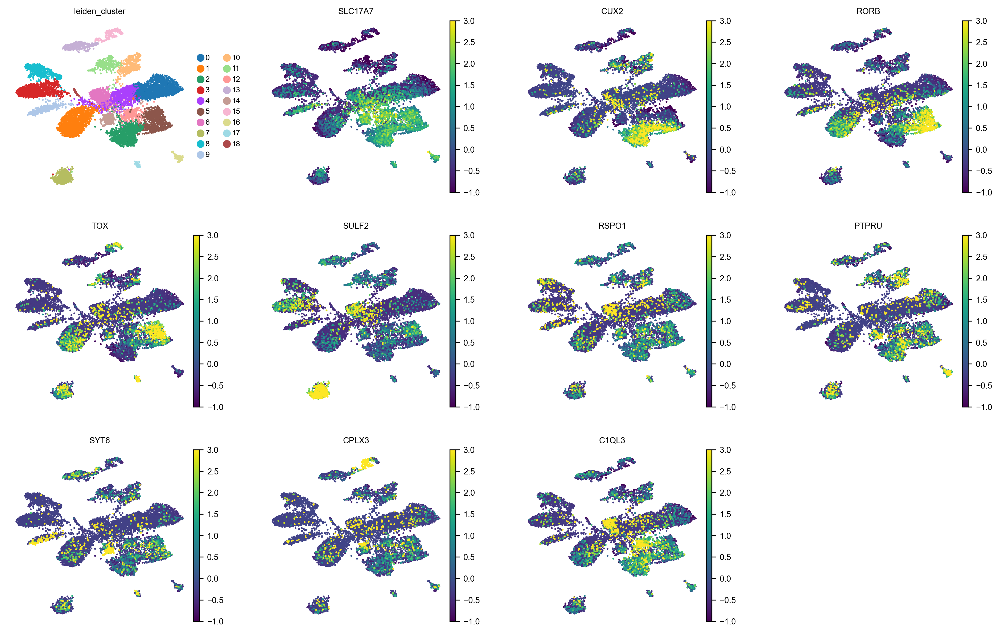

In [35]:
sc.pl.umap(adata, color=['leiden_cluster', 'SLC17A7','CUX2','RORB', 'TOX', 'SULF2', 'RSPO1','PTPRU','SYT6', 'CPLX3', 'C1QL3'],
           vmin=-1, vmax=3, save='_excitatory_gene.png')

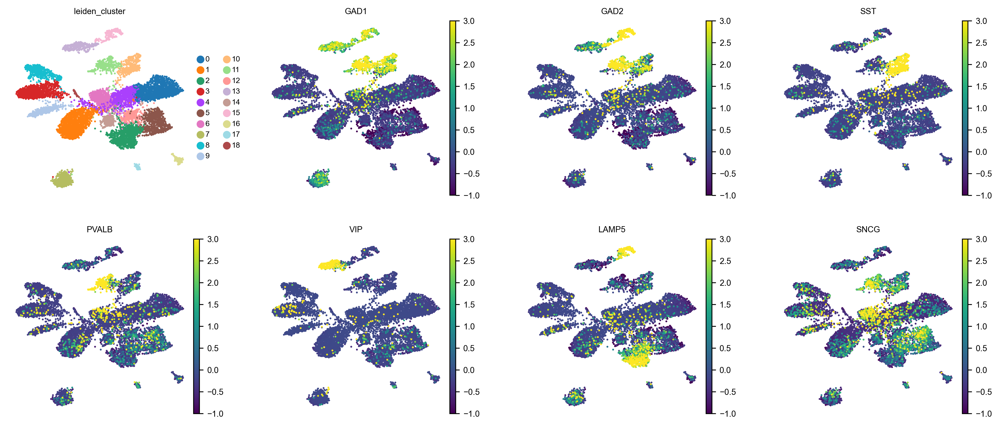

In [37]:
sc.pl.umap(adata, color=['leiden_cluster', 'GAD1','GAD2','SST','PVALB','VIP','LAMP5','SNCG'],
           vmin=-1, vmax=3, save='_inhibitory_gene.png')

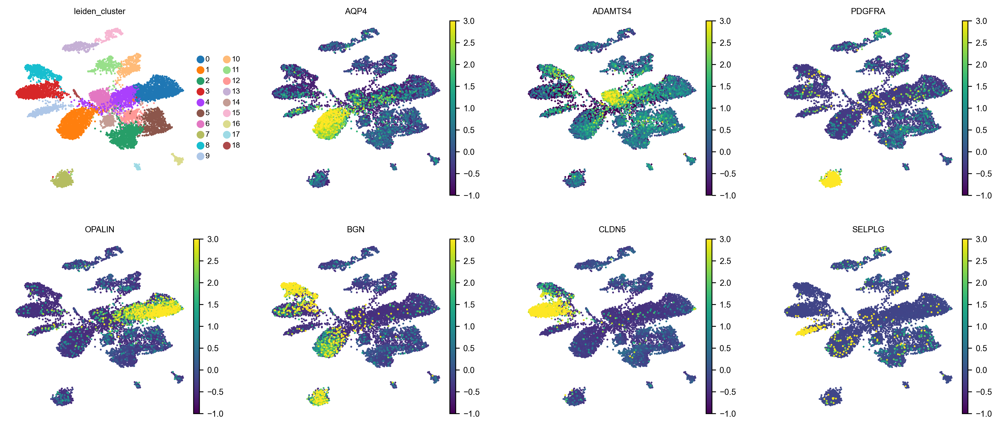

In [38]:
sc.pl.umap(adata, color=['leiden_cluster', 'AQP4', 'ADAMTS4', 'PDGFRA', 'OPALIN', 'BGN', 'CLDN5', 'SELPLG',],
           vmin=-1, vmax=3, save='_nonneuron_gene.png')

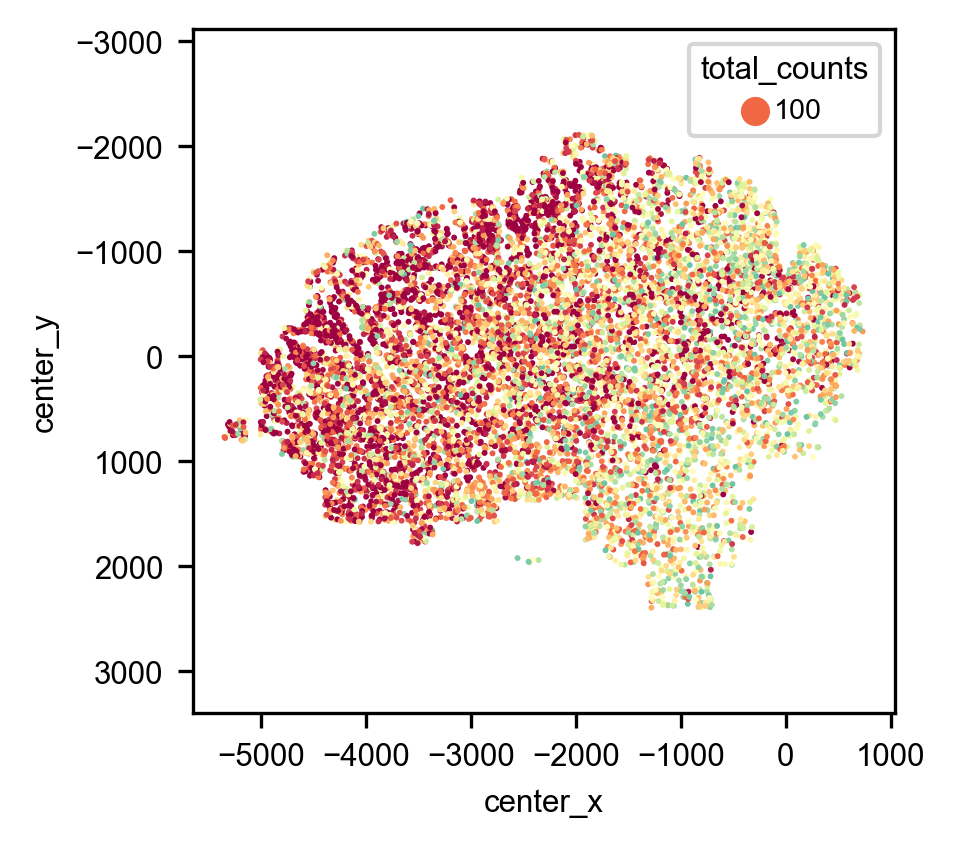

In [47]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
#plt.style.use('dark_background')
ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                     hue='total_counts', hue_norm=LogNorm(vmin=5,vmax=200), 
                     palette='Spectral_r',
                     s=2, linewidth=0,
                     legend=True, )

ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
#ax.legend(hs,ls, ncol=8, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-total_counts.png'), transparent=True)
plt.show()

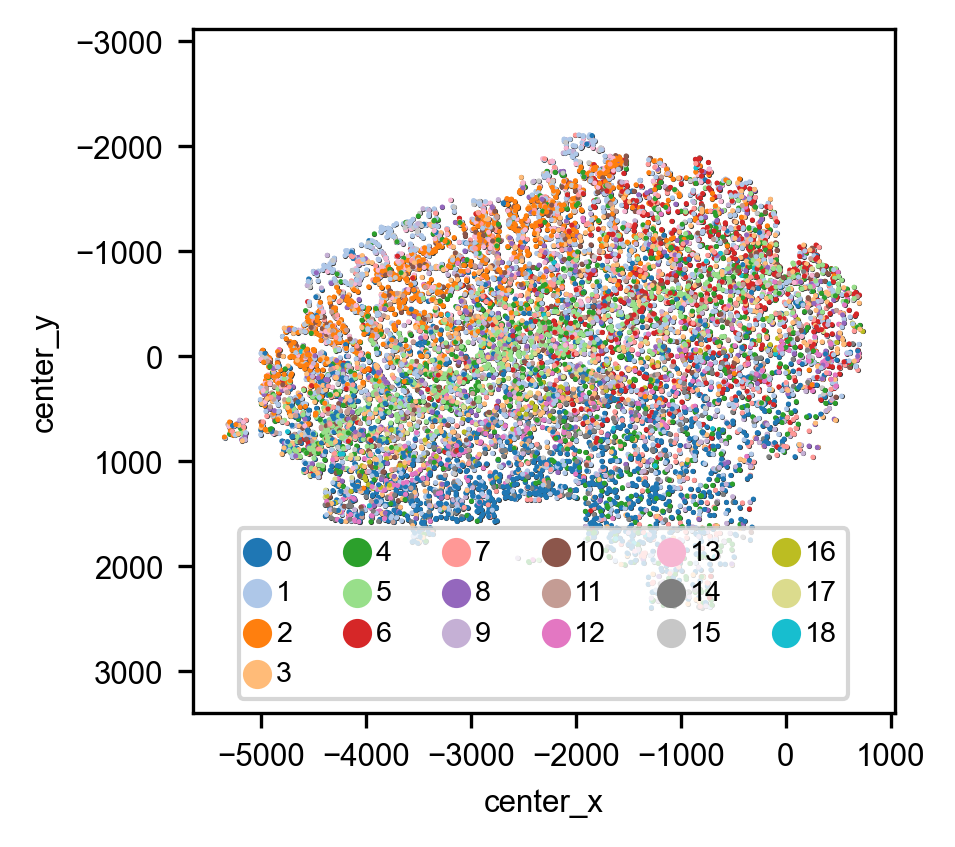

In [30]:
import matplotlib.pyplot as plt
# visualzie the spatial dist for clusters
#sel_clusters = ['0', '1', '2', '3', '4', '5']
sel_clusters = np.unique(adata.obs['leiden'])

sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden']) if _cls in sel_clusters]
ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.2,0.2,0.2], s=1.5, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden', s=1.5, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=6, loc=8)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, 'spatial-all_clusters.png'), transparent=True)
plt.show()

# 6.UMAP can be done using different settings and can be saved into different label column for cell type classifer use later

## 6.1 Use higher expected pcs and resolution to UMAP for cell-type distinction at "cluster" level

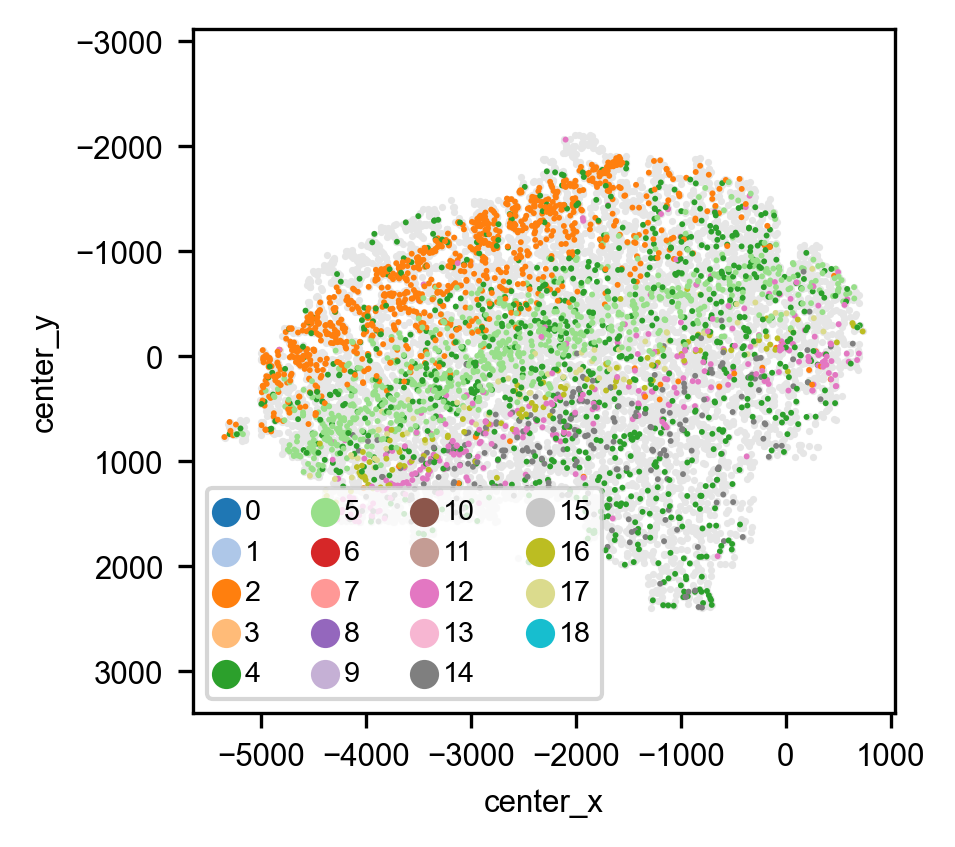

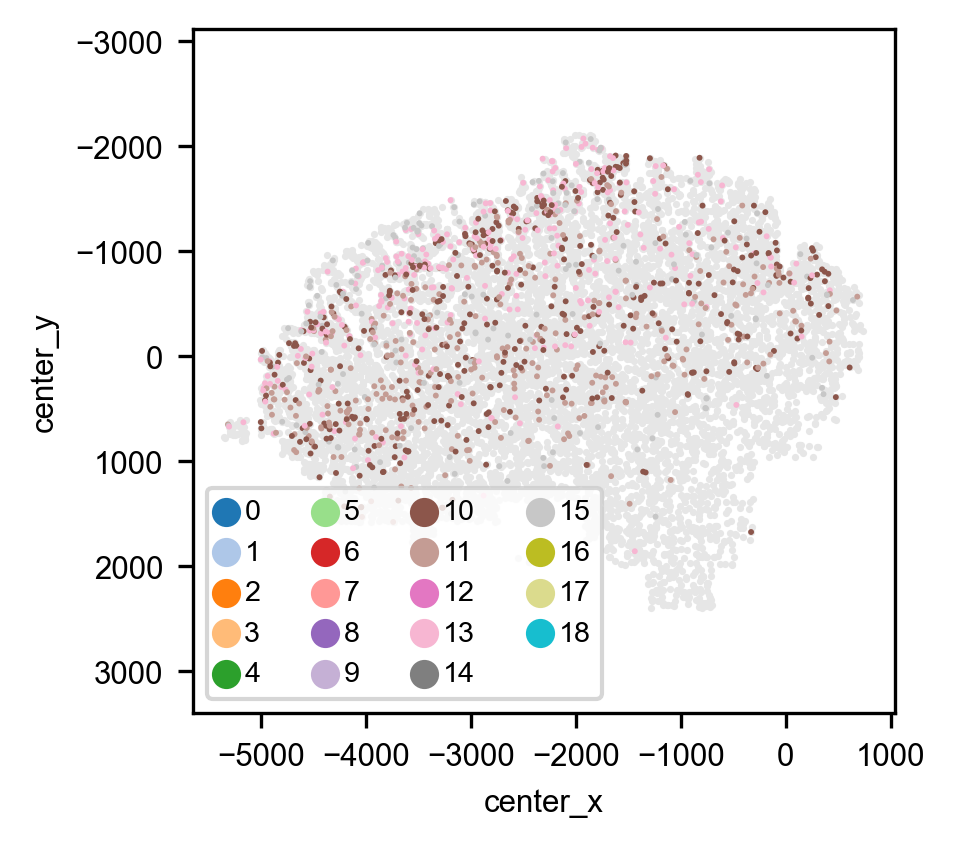

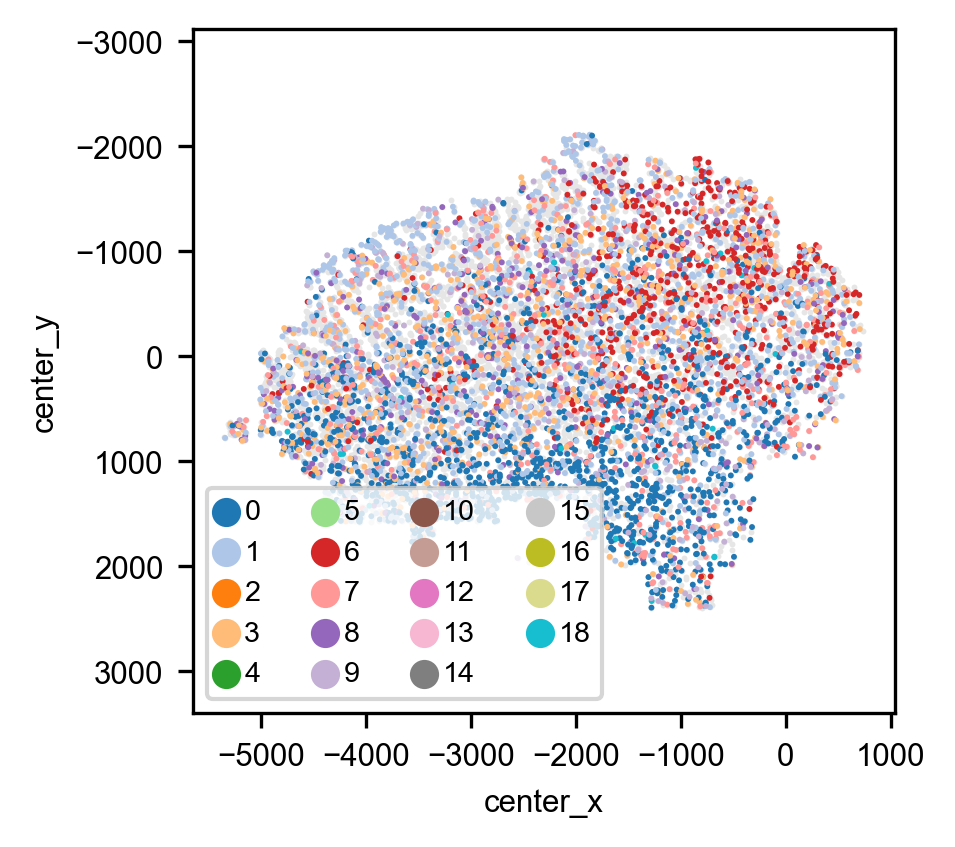

In [50]:
# visualzie the spatial dist for clusters

sel_clusters = [str(_cls) for _cls in excitatory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=4, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_excitatory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in inhibitory_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=3, legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2, legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=4, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_inhibitory_clusters.png'), transparent=True)
plt.show()


sel_clusters = [str(_cls) for _cls in nonneuron_clusters]
sel_inds = [_i for _i, _cls in zip(adata.obs.index, adata.obs['leiden_cluster']) if str(_cls) in sel_clusters]

ax1 = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                      color=[0.9,0.9,0.9], s=2., legend=True, linewidth=0)

ax = sns.scatterplot(data=adata.obs.loc[sel_inds], x='center_x', y='center_y', 
                     palette='tab20',
                     hue='leiden_cluster', s=2., legend=True, linewidth=0)
ax.grid(False)
ax.invert_yaxis()
plt.axis('equal')
hs, ls = ax.get_legend_handles_labels()
ax.legend(hs,ls, ncol=4, loc=3)
#plt.xlim([2250,3850])
#plt.ylim([-1600,0])
plt.savefig(os.path.join(figure_folder, f'spatial_nonneuron_clusters.png'), transparent=True)
plt.show()

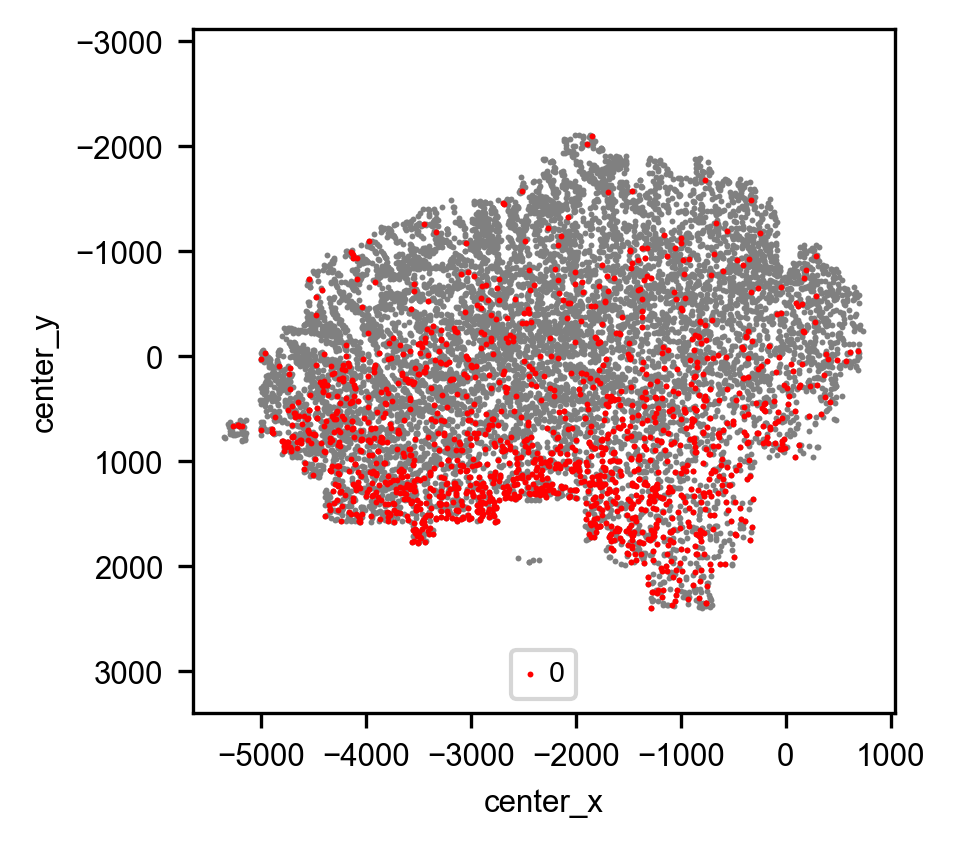

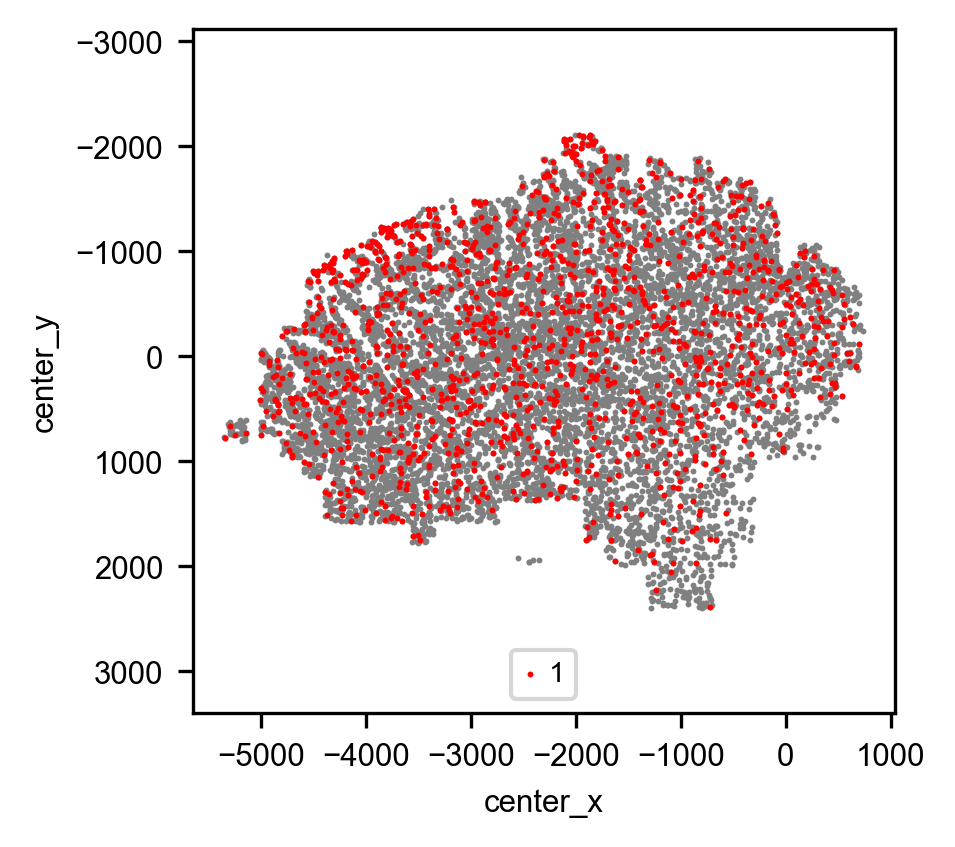

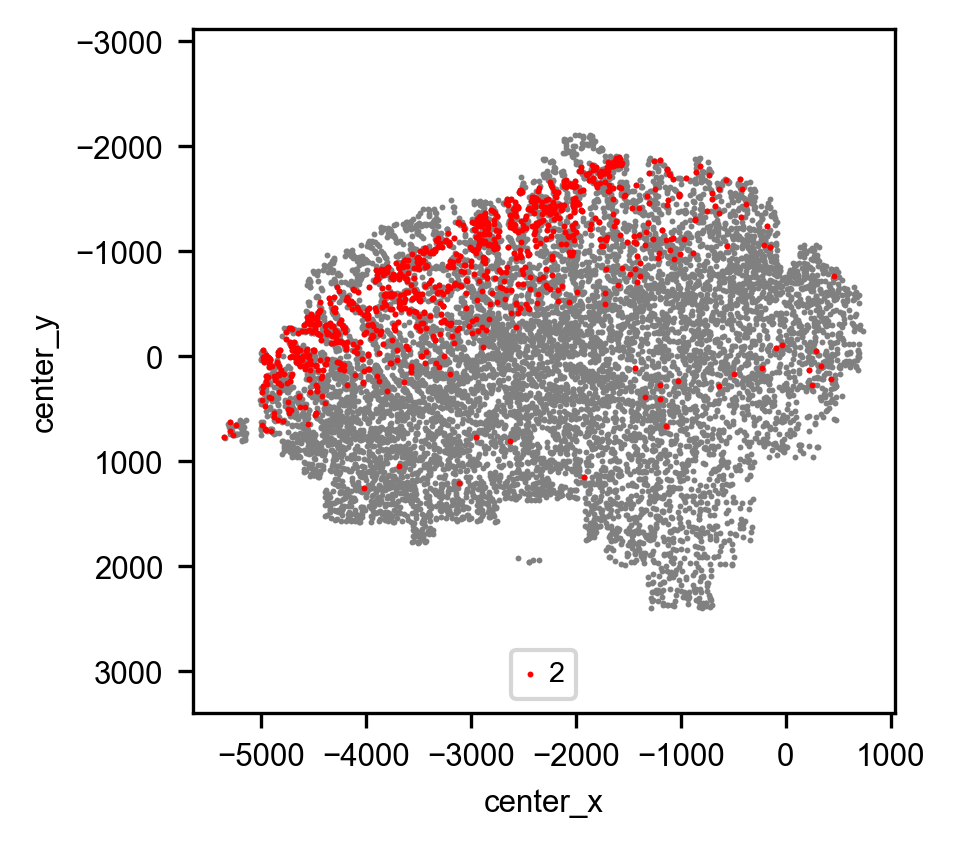

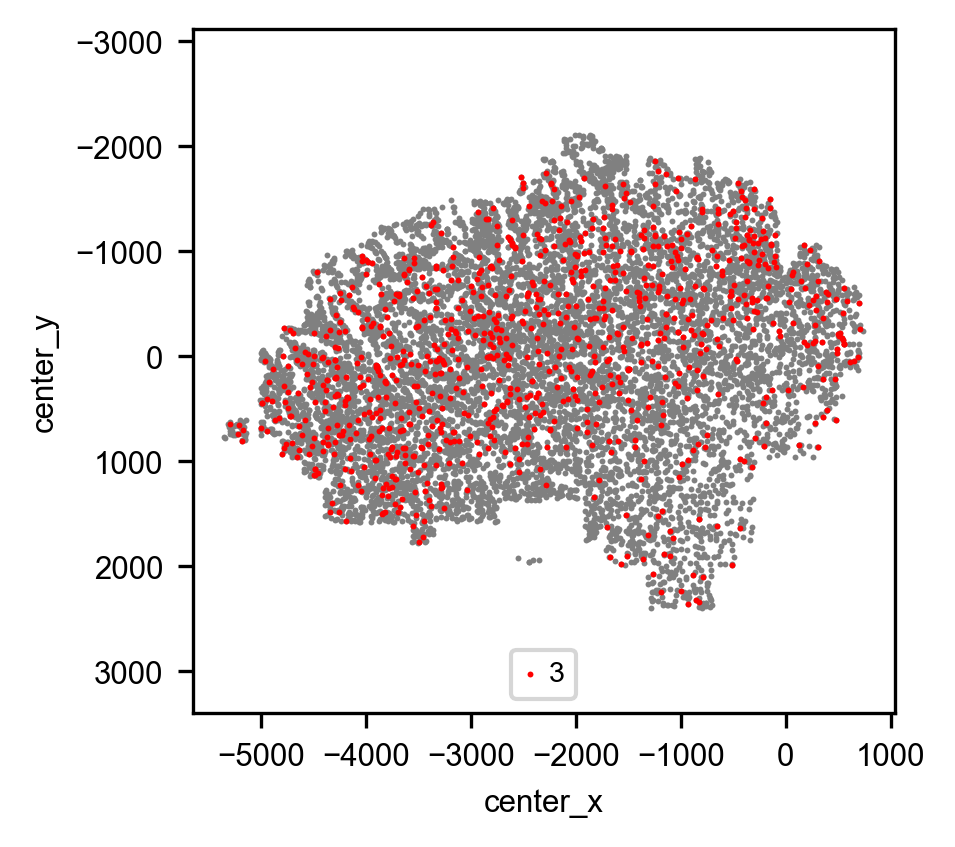

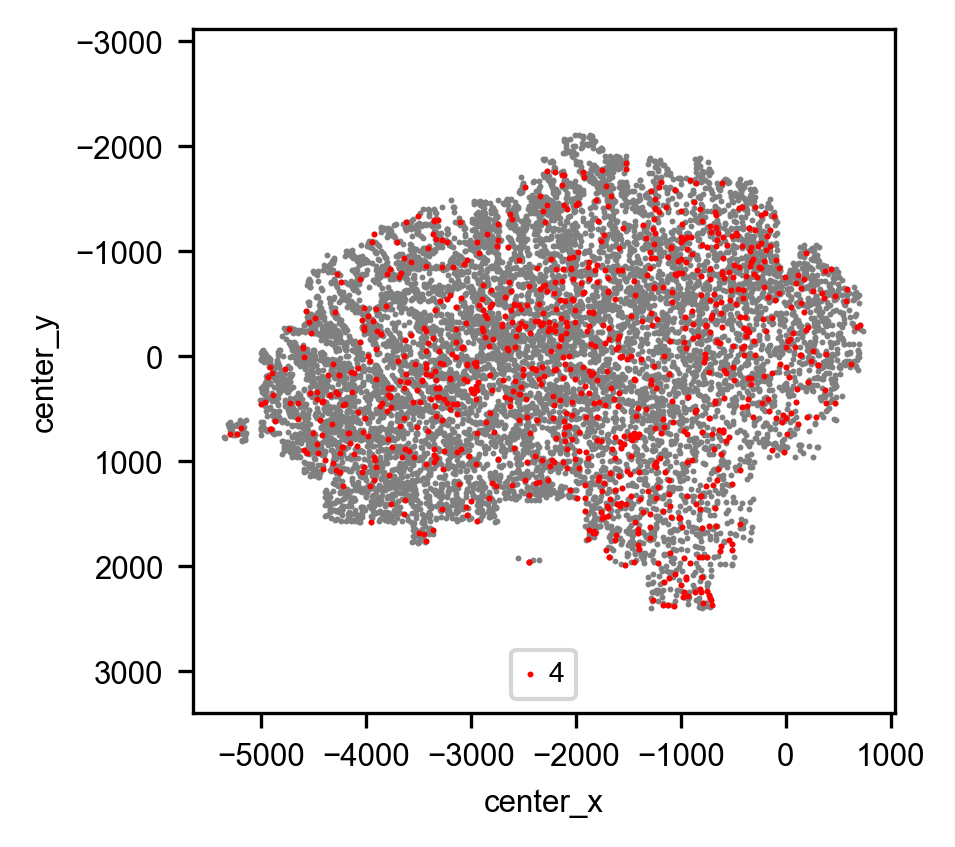

...

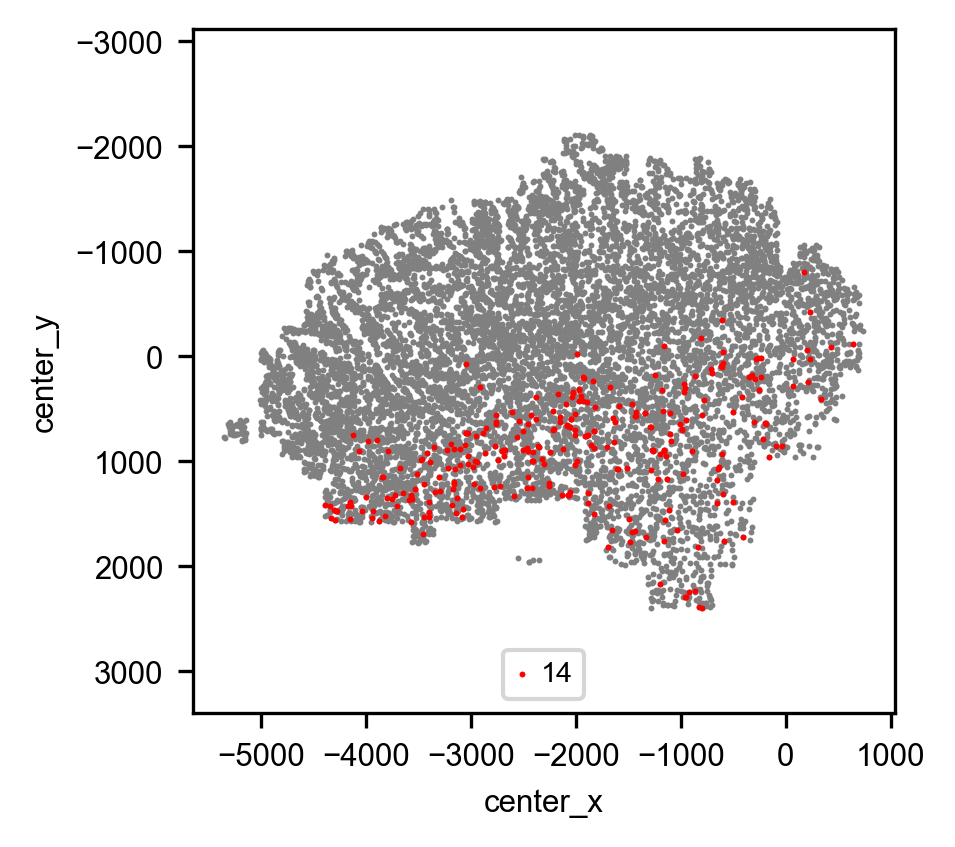

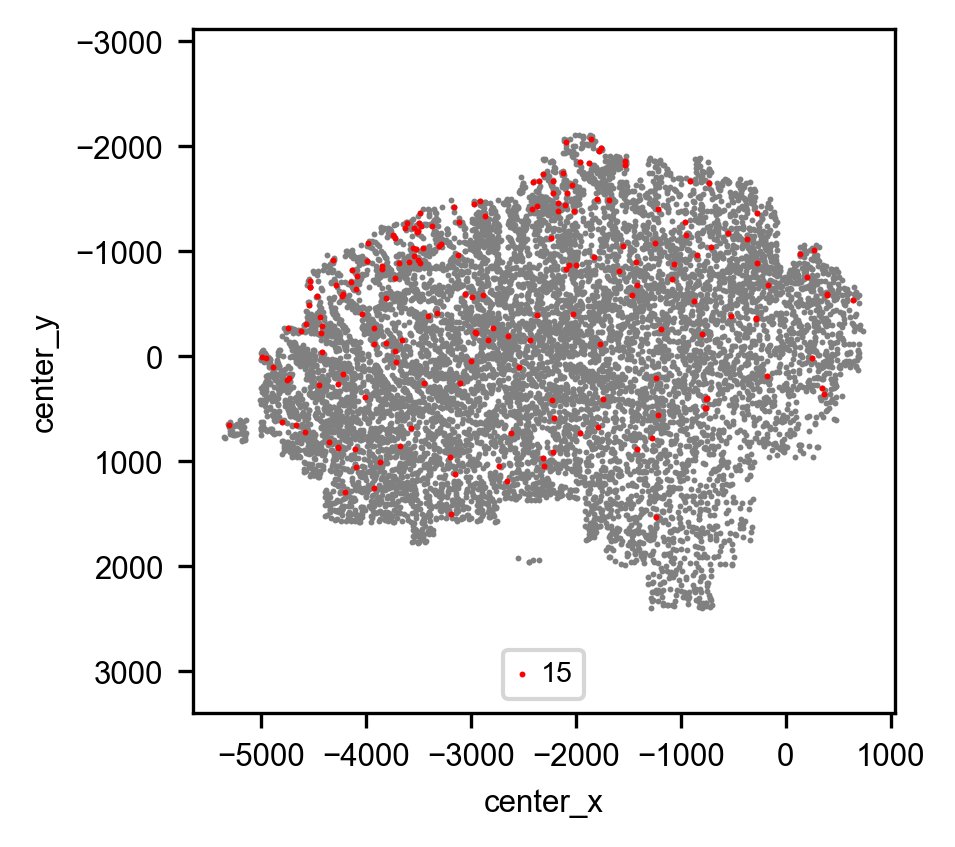

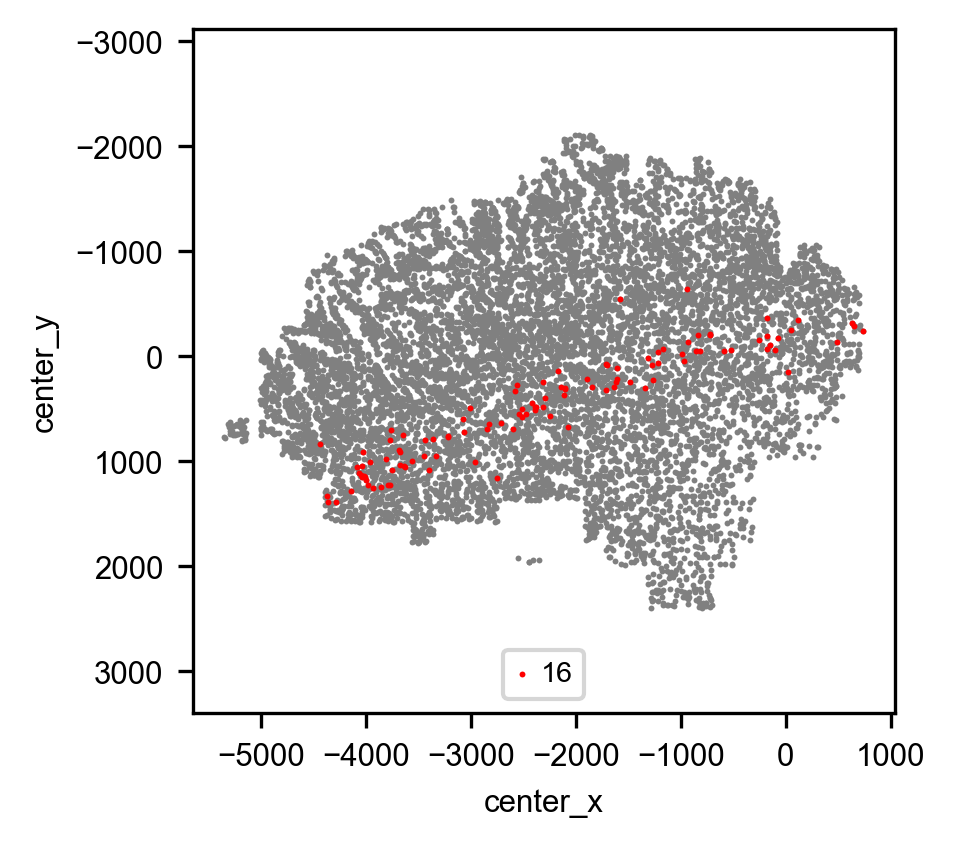

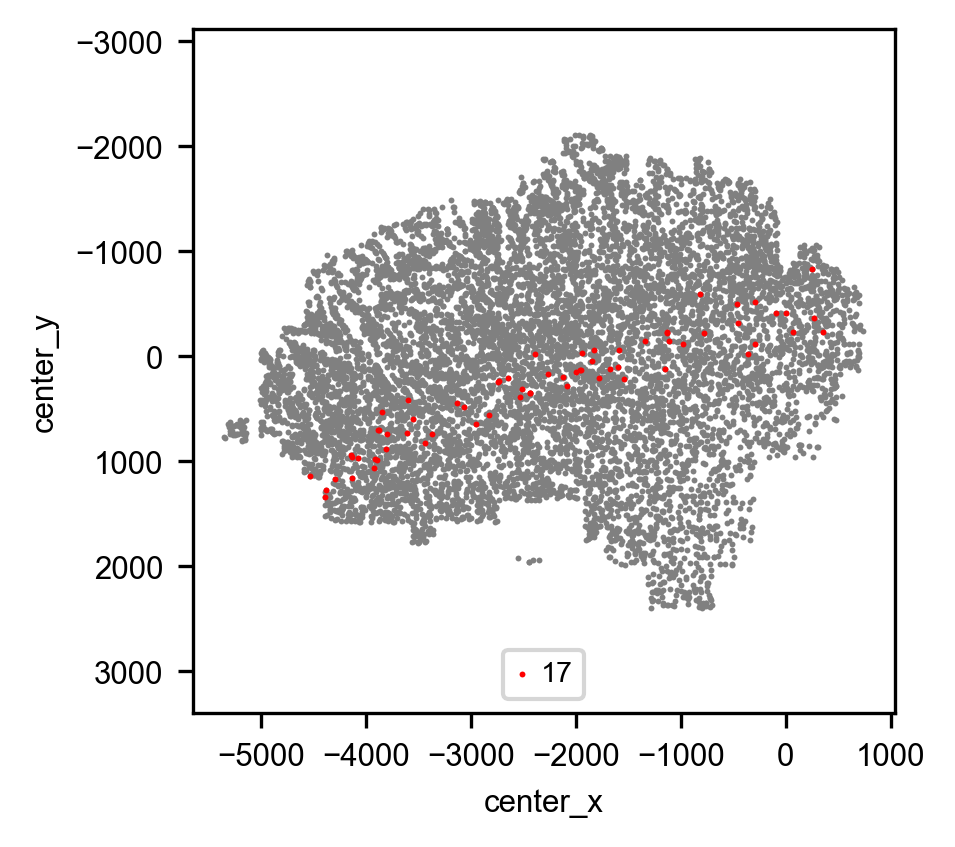

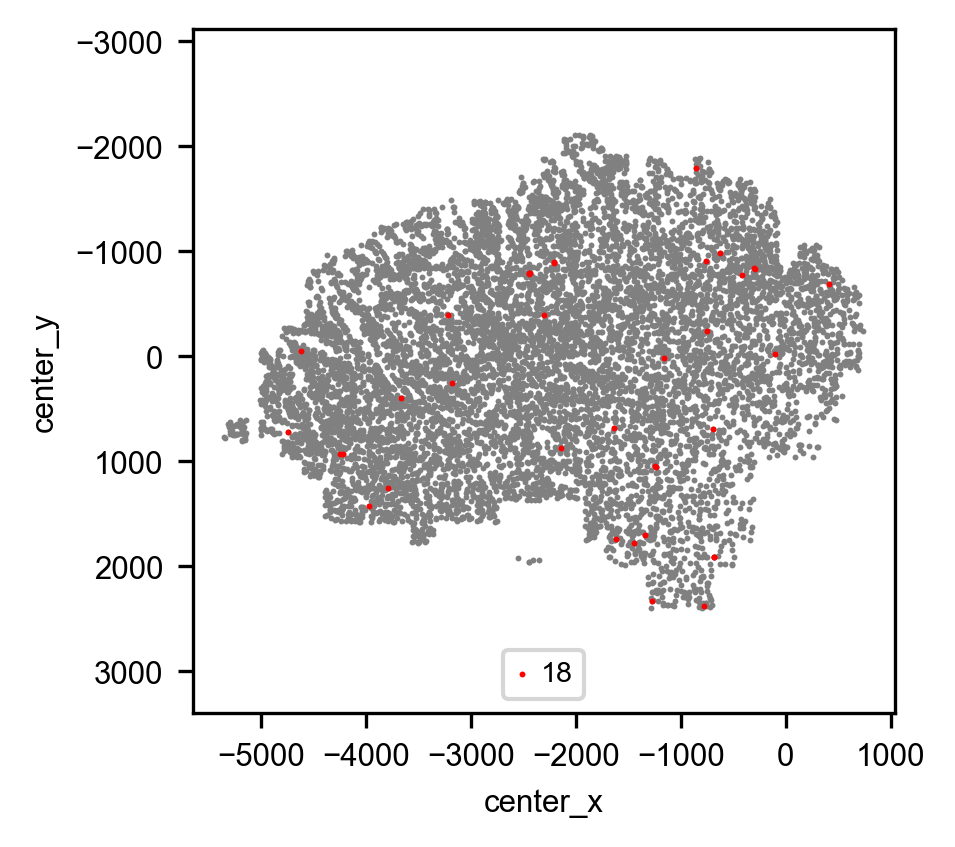

In [32]:
# visualzie the spatial dist for clusters
import matplotlib.pyplot as plt
for _class in sorted(np.unique(adata.obs['leiden_cluster']), key=lambda v:int(v)):
    #plt.style.use('dark_background')
    ax = sns.scatterplot(data=adata.obs, x='center_x', y='center_y', 
                    color='grey', s=2, legend=True, linewidth=0)
    ax = sns.scatterplot(data=adata.obs.loc[adata.obs['leiden_cluster']==_class], 
                         x='center_x', y='center_y', 
                    color='r', s=2, legend=True, label=_class, linewidth=0)
    ax.grid(False)
    ax.invert_yaxis()
    plt.axis('equal')
    hs, ls = ax.get_legend_handles_labels()
    ax.legend(hs,ls, ncol=8, loc=8)
    plt.show()

# 7. Save the analyzed MERFISH adata in h5ad for later use (e.g., cell classifer)

In [36]:
save_filename = os.path.join(os.path.join(postanalysis_folder, 'filtered_cluster_data.h5ad'))

overwrite = True

if not os.path.exists(save_filename) or overwrite:
    print(f"save adata into file: {save_filename}")
    adata.write(save_filename)
else:
    print(f"savefile: {save_filename} already exists")

save adata into file: I:\MERFISH_Analysis\20221026-hM1_hM1\PostAnalysis\filtered_cluster_data.h5ad
